# 608 Assignment 2

In [1]:
import datashader as ds
import datashader.transfer_functions as tf
import datashader.glyphs
from datashader import reductions
from datashader.core import bypixel
from datashader.utils import lnglat_to_meters as webm, export_image
from datashader.colors import colormap_select, Greys9, viridis, inferno
import copy


from pyproj import Proj, transform
import numpy as np
import pandas as pd
import urllib
import json
import datetime
#import colorlover as cl

import plotly.offline as py
import plotly.graph_objs as go
from plotly import tools

# from shapely.geometry import Point, Polygon, shape
# In order to get shapley, you'll need to run [pip install shapely.geometry] from your terminal

from functools import partial

from IPython.display import GeoJSON

py.init_notebook_mode()


For module 2 we'll be looking at techniques for dealing with big data. In particular binning strategies and the datashader library (which possibly proves we'll never need to bin large data for visualization ever again.)

To demonstrate these concepts we'll be looking at the PLUTO dataset put out by New York City's department of city planning. PLUTO contains data about every tax lot in New York City.

PLUTO data can be downloaded from here. Unzip them to the same directory as this notebook, and you should be able to read them in using this (or very similar) code. Also take note of the data dictionary, it'll come in handy for this assignment.

In [2]:
# Code to read in v17, column names have been updated (without upper case letters) for v18

# bk = pd.read_csv('PLUTO17v1.1/BK2017V11.csv')
# bx = pd.read_csv('PLUTO17v1.1/BX2017V11.csv')
# mn = pd.read_csv('PLUTO17v1.1/MN2017V11.csv')
# qn = pd.read_csv('PLUTO17v1.1/QN2017V11.csv')
# si = pd.read_csv('PLUTO17v1.1/SI2017V11.csv')

# ny = pd.concat([bk, bx, mn, qn, si], ignore_index=True)

ny = pd.read_csv('pluto_20v8.csv', low_memory=False)


# Getting rid of some outliers
ny = ny[(ny['yearbuilt'] > 1850) & (ny['yearbuilt'] < 2020) & (ny['numfloors'] != 0)]

# wgs84 = Proj("+proj=longlat +ellps=GRS80 +datum=NAD83 +no_defs")
# nyli = Proj("+proj=lcc +lat_1=40.66666666666666 +lat_2=41.03333333333333 +lat_0=40.16666666666666 +lon_0=-74 +x_0=300000 +y_0=0 +ellps=GRS80 +datum=NAD83 +to_meter=0.3048006096012192 +no_defs")
# ny['xcoord'] = 0.3048*ny['xcoord']
# ny['ycoord'] = 0.3048*ny['ycoord']
# ny['lon'], ny['lat'] = transform(nyli, wgs84, ny['xcoord'].values, ny['ycoord'].values)

# ny = ny[(ny['lon'] < -60) & (ny['lon'] > -100) & (ny['lat'] < 60) & (ny['lat'] > 20)]

#Defining some helper functions for DataShader
background = "black"
export = partial(export_image, background = background, export_path="export")
cm = partial(colormap_select, reverse=(background!="black"))

In [3]:
ny.head

<bound method NDFrame.head of        borough  block  lot     cd  ct2010  cb2010  schooldist  council  \
0           MN   1949   50  110.0   257.0  1005.0         5.0      9.0   
1           BK   6372   69  311.0   284.0  3000.0        20.0     47.0   
2           BK   6436   44  311.0   280.0  2005.0        20.0     43.0   
4           BK   6746  110  314.0   538.0  3003.0        21.0     48.0   
5           MN   1472   33  108.0   132.0  2001.0         2.0      5.0   
...        ...    ...  ...    ...     ...     ...         ...      ...   
858435      BX   4840   75  212.0   406.0  3000.0        11.0     12.0   
858461      MN   1840   41  107.0   189.0  1001.0         3.0      7.0   
858465      BK   7417   75  315.0   590.0  1002.0        22.0     48.0   
858467      BX   5014   64  212.0   428.0  2002.0        11.0     12.0   
858469      QN    515  118  401.0    79.0  1000.0        30.0     22.0   

        zipcode firecomp  ...  appbbl  appdate  plutomapid  firm07_flag  \
0     

In [4]:
ny.columns

Index(['borough', 'block', 'lot', 'cd', 'ct2010', 'cb2010', 'schooldist',
       'council', 'zipcode', 'firecomp', 'policeprct', 'healthcenterdistrict',
       'healtharea', 'sanitboro', 'sanitdistrict', 'sanitsub', 'address',
       'zonedist1', 'zonedist2', 'zonedist3', 'zonedist4', 'overlay1',
       'overlay2', 'spdist1', 'spdist2', 'spdist3', 'ltdheight', 'splitzone',
       'bldgclass', 'landuse', 'easements', 'ownertype', 'ownername',
       'lotarea', 'bldgarea', 'comarea', 'resarea', 'officearea', 'retailarea',
       'garagearea', 'strgearea', 'factryarea', 'otherarea', 'areasource',
       'numbldgs', 'numfloors', 'unitsres', 'unitstotal', 'lotfront',
       'lotdepth', 'bldgfront', 'bldgdepth', 'ext', 'proxcode', 'irrlotcode',
       'lottype', 'bsmtcode', 'assessland', 'assesstot', 'exempttot',
       'yearbuilt', 'yearalter1', 'yearalter2', 'histdist', 'landmark',
       'builtfar', 'residfar', 'commfar', 'facilfar', 'borocode', 'bbl',
       'condono', 'tract2010', 'xcoo

## Part 1: Binning and Aggregation

Binning is a common strategy for visualizing large datasets. Binning is inherent to a few types of visualizations, such as histograms and 2D histograms (also check out their close relatives: 2D density plots and the more general form: heatmaps.

While these visualization types explicitly include binning, any type of visualization used with aggregated data can be looked at in the same way. For example, lets say we wanted to look at building construction over time. This would be best viewed as a line graph, but we can still think of our results as being binned by year:



In [5]:
trace = go.Scatter(
    # I'm choosing BBL here because I know it's a unique key.
    x = ny.groupby('yearbuilt').count()['bbl'].index,
    y = ny.groupby('yearbuilt').count()['bbl']
)

layout = go.Layout(
    xaxis = dict(title = 'Year Built'),
    yaxis = dict(title = 'Number of Lots Built')
)

fig = go.FigureWidget(data = [trace], layout = layout)

fig

FigureWidget({
    'data': [{'type': 'scatter',
              'uid': '5341ee8a-2ca7-4f53-8951-7dc489ea04db',
 …

## Question
After a few building collapses, the City of New York is going to begin investigating older buildings for safety. The city is particularly worried about buildings that were unusually tall when they were built, since best-practices for safety hadn’t yet been determined. Create a graph that shows how many buildings of a certain number of floors were built in each year (note: you may want to use a log scale for the number of buildings). Find a strategy to bin buildings (It should be clear 20-29-story buildings, 30-39-story buildings, and 40-49-story buildings were first built in large numbers, but does it make sense to continue in this way as you get taller?)

In [44]:
ny['numfloors'].value_counts()

2.00     415841
3.00     119370
2.50      81804
1.00      74313
4.00      27944
          ...  
0.21          1
2.15          1
5.09          1
82.00         1
18.50         1
Name: numfloors, Length: 177, dtype: int64

Upon investigation of value counts for numfloors, we see that some records contain decimals. Let's round up to whole numbers and plot a histogram with bin sizes of 9.

In [145]:
#round up
ny['numfloors'] = np.ceil(ny['numfloors'])

#create histogram
data = [go.Histogram(x=ny['numfloors'], nbinsx = 20)]

layout = go.Layout(
    xaxis=dict(
        type='linear',
        title = 'Number of Floors'
    ),
    yaxis=dict(
        type='log',
        title = 'Number of Buildings'
    )
)
fig = go.FigureWidget(data=data, layout=layout)
fig.show()

Based on the results we see that as number of floors decrease, number of buildings decrease. Since the 90-99 and 100-109 bins contain very few number of buildings, let's combine them and create one bin for 80-109 number of floors. Next let's create a histogram of numfloors by decade.

In [176]:
#create decade column
ny['yearbuiltdecade'] = np.floor(ny['yearbuilt']/10)*10

from plotly.subplots import make_subplots
fig=make_subplots(rows=5, cols=2)

#create histograms by number of floors ranges
floorRange0=ny[(ny['numfloors']>=0) & (ny['numfloors']<10)]

trace0=go.Histogram(
        x=floorRange0.groupby('yearbuiltdecade').count()['bbl'].index,
        y=floorRange0.groupby('yearbuiltdecade').count()['bbl'], nbinsx=10)

floorRange1=ny[(ny['numfloors']>=10) & (ny['numfloors']<20)]

trace1=go.Histogram(
        x=floorRange1.groupby('yearbuiltdecade').count()['bbl'].index,
        y=floorRange1.groupby('yearbuiltdecade').count()['bbl'], nbinsx=10)

floorRange2=ny[(ny['numfloors']>=20) & (ny['numfloors']<30)]

trace2=go.Histogram(
        x=floorRange2.groupby('yearbuiltdecade').count()['bbl'].index,
        y=floorRange2.groupby('yearbuiltdecade').count()['bbl'], nbinsx=10)

floorRange3=ny[(ny['numfloors']>=30) & (ny['numfloors']<40)]

trace3=go.Histogram(
        x=floorRange3.groupby('yearbuiltdecade').count()['bbl'].index,
        y=floorRange3.groupby('yearbuiltdecade').count()['bbl'], nbinsx=10)

floorRange4=ny[(ny['numfloors']>=40) & (ny['numfloors']<50)]

trace4=go.Histogram(
        x=floorRange4.groupby('yearbuiltdecade').count()['bbl'].index,
        y=floorRange4.groupby('yearbuiltdecade').count()['bbl'], nbinsx=10)

floorRange5=ny[(ny['numfloors']>=50) & (ny['numfloors']<60)]

trace5=go.Histogram(
        x=floorRange5.groupby('yearbuiltdecade').count()['bbl'].index,
        y=floorRange5.groupby('yearbuiltdecade').count()['bbl'], nbinsx=10)

floorRange6=ny[(ny['numfloors']>=60) & (ny['numfloors']<70)]

trace6=go.Histogram(
        x=floorRange6.groupby('yearbuiltdecade').count()['bbl'].index,
        y=floorRange6.groupby('yearbuiltdecade').count()['bbl'], nbinsx=10)

floorRange7=ny[(ny['numfloors']>=70) & (ny['numfloors']<80)]

trace7=go.Histogram(
        x=floorRange7.groupby('yearbuiltdecade').count()['bbl'].index,
        y=floorRange7.groupby('yearbuiltdecade').count()['bbl'], nbinsx=10)

floorRange8=ny[(ny['numfloors']>=80) & (ny['numfloors']<109)]

trace8=go.Histogram(
        x=floorRange8.groupby('yearbuiltdecade').count()['bbl'].index,
        y=floorRange8.groupby('yearbuiltdecade').count()['bbl'], nbinsx=10)


data=[trace0,trace1,trace2,trace3,trace4,trace5,trace6,trace7,trace8]


layout = go.Layout(
            xaxis = dict(title = 'Decade Built'),
            yaxis = dict(title = 'Number of Floors')
            )

fig.append_trace(trace0, 1, 1)
fig.append_trace(trace1, 1, 2)
fig.append_trace(trace2, 2, 1)
fig.append_trace(trace3, 2, 2)
fig.append_trace(trace4, 3, 1)
fig.append_trace(trace5, 3, 2)
fig.append_trace(trace6, 4, 1)
fig.append_trace(trace7, 4, 2)
fig.append_trace(trace8, 5, 1)

#set title and axes names
fig['layout'].update(height=800, width=1000, showlegend=True, title='Number of Buildings Built by Decade')
fig.update_xaxes(title_text='Decade', row=5,col=1)
fig.update_yaxes(title_text='Number of Buildings',row=3,col=1)

fig.show()

## Part 2: Datashader
Datashader is a library from Anaconda that does away with the need for binning data. It takes in all of your datapoints, and based on the canvas and range returns a pixel-by-pixel calculations to come up with the best representation of the data. In short, this completely eliminates the need for binning your data.

As an example, lets continue with our question above and look at a 2D histogram of YearBuilt vs NumFloors:

In [191]:

yearbins = 200
floorbins = 200

yearBuiltCut = pd.cut(ny['yearbuilt'], np.linspace(ny['yearbuilt'].min(), ny['yearbuilt'].max(), yearbins))
numFloorsCut = pd.cut(ny['numfloors'], np.logspace(1, np.log(ny['numfloors'].max()), floorbins))

xlabels = np.floor(np.linspace(ny['yearbuilt'].min(), ny['yearbuilt'].max(), yearbins))
ylabels = np.floor(np.logspace(1, np.log(ny['numfloors'].max()), floorbins))

fig = go.FigureWidget(
    data = [
        go.Heatmap(z = ny.groupby([numFloorsCut, yearBuiltCut])['bbl'].count().unstack().fillna(0).values,
              colorscale = 'Greens', x = xlabels, y = ylabels)
    ]
)

fig

FigureWidget({
    'data': [{'colorscale': [[0.0, 'rgb(247,252,245)'], [0.125,
                             'r…


This shows us the distribution, but it's subject to some biases discussed in the Anaconda notebook Plotting Perils.

Here is what the same plot would look like in datashader:

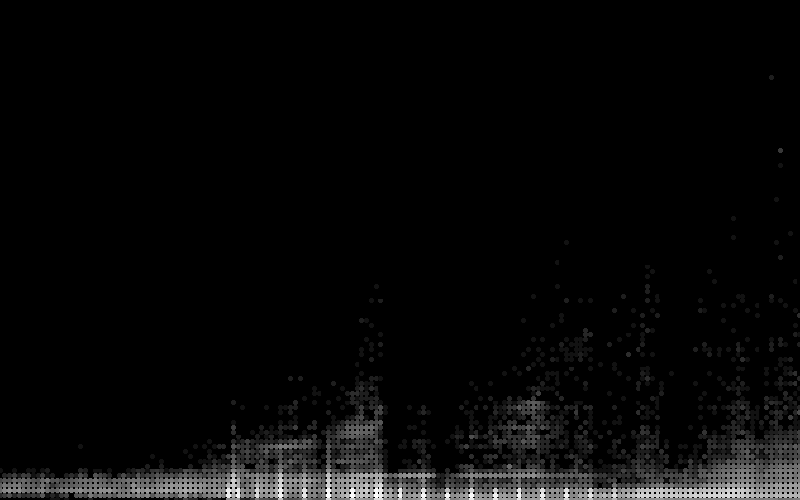

In [186]:
cvs = ds.Canvas(800, 500, x_range = (ny['yearbuilt'].min(), ny['yearbuilt'].max()), 
                                y_range = (ny['numfloors'].min(), ny['numfloors'].max()))
agg = cvs.points(ny, 'yearbuilt', 'numfloors')
view = tf.shade(agg, cmap = cm(Greys9), how='log')
export(tf.spread(view, px=2), 'yearvsnumfloors')

That's technically just a scatterplot, but the points are smartly placed and colored to mimic what one gets in a heatmap. Based on the pixel size, it will either display individual points, or will color the points of denser regions.

Datashader really shines when looking at geographic information. Here are the latitudes and longitudes of our dataset plotted out, giving us a map of the city colored by density of structures:

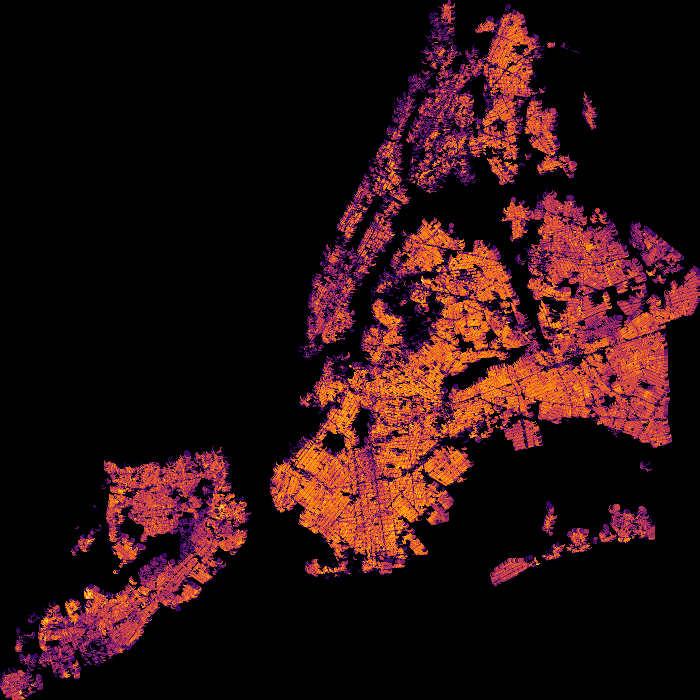

In [185]:
NewYorkCity   = (( 913164.0,  1067279.0), (120966.0, 272275.0))
cvs = ds.Canvas(700, 700, *NewYorkCity)
agg = cvs.points(ny, 'xcoord', 'ycoord')
view = tf.shade(agg, cmap = cm(inferno), how='log')
export(tf.spread(view, px=2), 'firery')

Interestingly, since we're looking at structures, the large buildings of Manhattan show up as less dense on the map. The densest areas measured by number of lots would be single or multi family townhomes.

Unfortunately, Datashader doesn't have the best documentation. Browse through the examples from their github repo. I would focus on the visualization pipeline and the US Census Example for the question below. Feel free to use my samples as templates as well when you work on this problem.

## Question¶
You work for a real estate developer and are researching underbuilt areas of the city. After looking in the Pluto data dictionary, you've discovered that all tax assessments consist of two parts: The assessment of the land and assessment of the structure. You reason that there should be a correlation between these two values: more valuable land will have more valuable structures on them (more valuable in this case refers not just to a mansion vs a bungalow, but an apartment tower vs a single family home). Deviations from the norm could represent underbuilt or overbuilt areas of the city. You also recently read a really cool blog post about bivariate choropleth maps, and think the technique could be used for this problem.

Datashader is really cool, but it's not that great at labeling your visualization. Don't worry about providing a legend, but provide a quick explanation as to which areas of the city are overbuilt, which areas are underbuilt, and which areas are built in a way that's properly correlated with their land value.

In [189]:
ny['assessland'].describe()

count    8.106760e+05
mean     1.101640e+05
std      4.076812e+06
min      0.000000e+00
25%      1.038000e+04
50%      1.416000e+04
75%      2.184000e+04
max      3.211276e+09
Name: assessland, dtype: float64

In [190]:
ny['assesstot'].describe()

count    8.106760e+05
mean     5.409865e+05
std      1.091943e+07
min      0.000000e+00
25%      3.732000e+04
50%      5.280000e+04
75%      9.492000e+04
max      7.240287e+09
Name: assesstot, dtype: float64

In [197]:
#min for both variables is 0, so add 1 so log won't be undefined
ny['assessland_log'] = np.log10(ny['assessland']+1)
ny['assesstot_log'] = np.log10(ny['assesstot']+1)

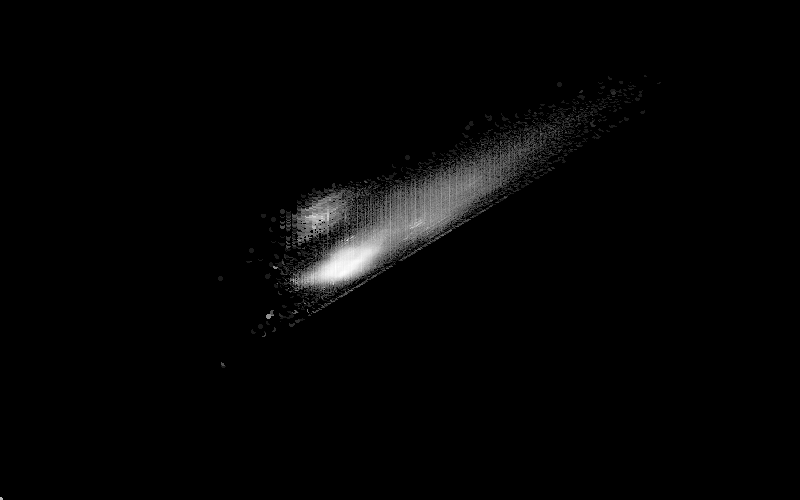

In [198]:
cvs = ds.Canvas(800, 500, x_range = (ny['assessland_log'].min(), ny['assessland_log'].max()), 
                                y_range = (ny['assesstot_log'].min(), ny['assesstot_log'].max()))
agg = cvs.points(ny, 'assessland_log', 'assesstot_log')
view = tf.shade(agg, cmap = cm(Greys9), how='log')
export(tf.spread(view, px=2), 'landvtotal')

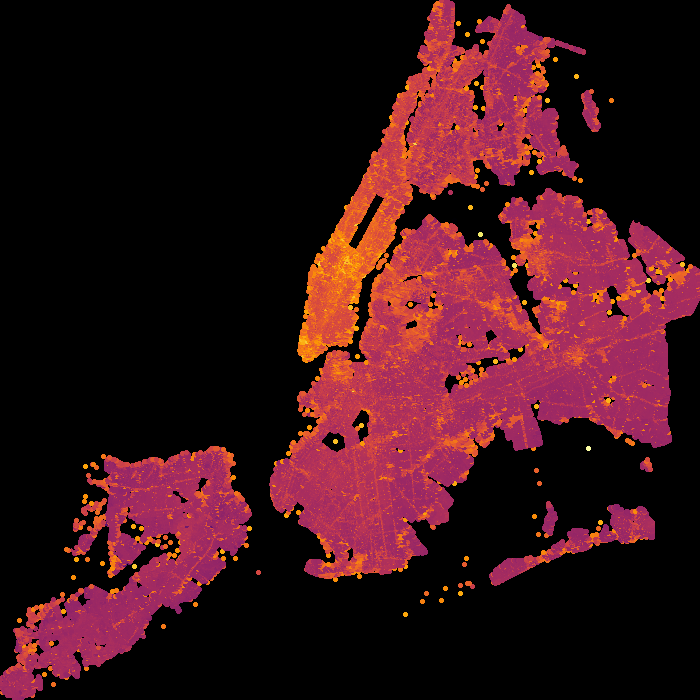

In [199]:
NewYorkCity   = (( 913164.0,  1067279.0), (120966.0, 272275.0))
cvs = ds.Canvas(700, 700, *NewYorkCity)
agg = cvs.points(ny, 'xcoord', 'ycoord', ds.mean('assessland'))
view = tf.shade(agg, cmap = cm(inferno), how='log')
export(tf.spread(view, px=2), 'firery')

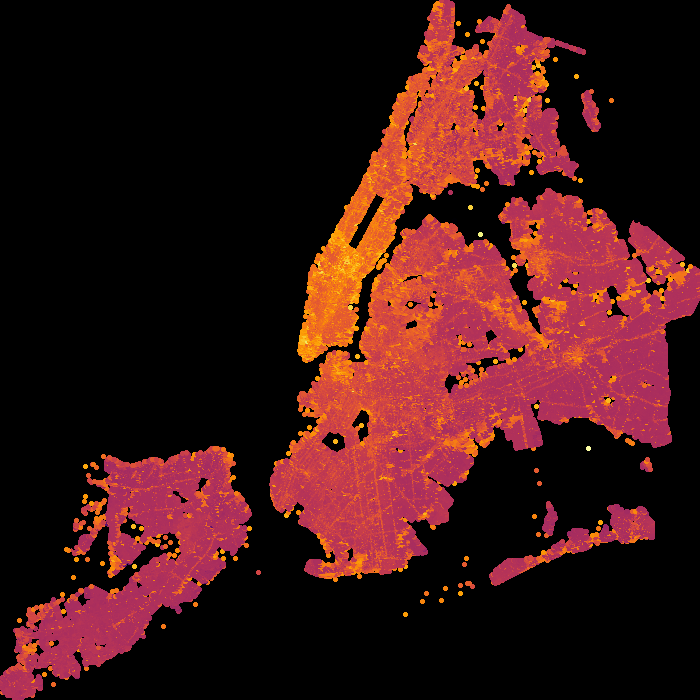

In [200]:
NewYorkCity   = (( 913164.0,  1067279.0), (120966.0, 272275.0))
cvs = ds.Canvas(700, 700, *NewYorkCity)
agg = cvs.points(ny, 'xcoord', 'ycoord', ds.mean('assesstot'))
view = tf.shade(agg, cmap = cm(inferno), how='log')
export(tf.spread(view, px=2), 'firery')

The previous 2 charts look pretty similar and show that the highest assessed land and assessed total value data points are largely concentrated in Lower Manhattan, espcially around the Financial District and Times Square.